# Introduction

Something about the project

In [ ]:
# Uncomment to install natural order sort if not installed
#!pip install natsort

In [2]:
# import libraries
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from natsort import natsorted
from sklearn.model_selection import train_test_split
from keras.models import load_model
import shutil
from tensorflow.keras.applications.vgg16 import preprocess_input
import pickle
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.losses import BinaryCrossentropy

# Preprocessing

## Image Folder Checks and Creation

In [3]:
print(os.getcwd())

/home/jupyter


In [3]:
#code to create the required directory if needed
#creating the folders based on the list of folder name

#orig_data_dir is the main folder of original images
orig_data_dir="AerialImageDataset"
orig_images_dir_X_train=os.path.join(orig_data_dir,"train","images")
orig_images_dir_y_train=os.path.join(orig_data_dir,"train","gt")

print(orig_images_dir_X_train)

#folder names of destination after tiling the images
list_foldersnames = ['data/all', 'data/all_masks']

if not os.path.exists(os.path.join(os.getcwd(), 'data/train')):
    #Creating the destination directory folders
    for folder in list_foldersnames:
        folder_path = os.path.join(os.getcwd(), folder)
        if not os.path.exists(folder_path):
             os.mkdir(folder_path)
             print(f"Folder created successfully: {folder_path}")
        else:
              print(f"Folder {folder_path} is available")
else:
    # Remove the already separated files to save space
    shutil.rmtree('data/all')
    shutil.rmtree('data/all_masks')
    
    # Assign the training folders
    list_foldersnames = ['data/train', 'data/train_masks']

AerialImageDataset/train/images


## Image Processing

In [4]:
# Tiling the images based on a specific tile_size
def tile_image(input_path, output_folder, tile_size,file_name):

    # Open the input image

    input_image = Image.open(os.path.join(input_path))

    # Get the dimensions of the input image
    input_width, input_height = input_image.size

    # Calculate the number of tiles in both dimensions
    num_tiles_x = input_width // tile_size
    num_tiles_y = input_height // tile_size

    # Extract tiles and save them
    for i in range(num_tiles_x):
        for j in range(num_tiles_y):
            # Calculate the cropping box
            left = i * tile_size
            upper = j * tile_size
            right = left + tile_size
            lower = upper + tile_size

            # Crop the tile from the input image
            tile = input_image.crop((left, upper, right, lower))

            # Save the tile to the output folder if it does not exist
            file_path = os.path.join(output_folder, f'{file_name}__tile_{j}_{i}.png')
            if not os.path.exists(file_path):
                tile.save(file_path)


In [5]:
# Tile size of output image
tile_size = 250

### Tiling the Images and its corresponding Masks

In [6]:
# Check if directory is empty before carrying out the tiling
def is_directory_empty(directory_path):
    return not any(os.listdir(directory_path))

# Function to set folder and call the tiling image function
def tiling(list_folder, orig_folder):
    # setting the output folder to train folder in the main directory
    output_folder = os.path.join(os.getcwd(),list_folder)

    if is_directory_empty(output_folder):
        # looping through
        for dirpath,dirnames,filenames in os.walk(orig_folder):
            for filename in filenames:
                input_path=os.path.join(dirpath,filename)
                filename = filename[:-4]
                tile_image(input_path, output_folder, tile_size,filename)

# Tile images
tiling(list_foldersnames[0], orig_images_dir_X_train)

# Tile masks
tiling(list_foldersnames[1], orig_images_dir_y_train)


## Covert the Image Path into DataFrame

In [7]:
# Convert the images and labels (masks) path into a dataframe for all the data
def create_df(list_folder_paths):    
    images = []
    labels = []
    labelpath = os.path.join(os.getcwd(), list_folder_paths[1])

    for dirpath,dirnames,filenames in os.walk(os.path.join(os.getcwd(), list_folder_paths[0])):
        if '.ipynb_checkpoints' in dirnames:
            dirnames.remove('.ipynb_checkpoints')
        for filename in filenames:
            images.append(os.path.join(dirpath,filename))
            labels.append(os.path.join(labelpath,filename))

    # Retrieve the filename as the fileId
    fileId = [os.path.splitext(os.path.basename(file_path))[0] for file_path in images]

    # Convert the lists to dataframe
    df = pd.DataFrame(zip(fileId, images, labels), columns=['id', 'roof_path', 'mask_path'])
    df.set_index('id',drop=True,inplace=True)
    
    # Sort the images accordingly as they were tiled in alphabetical order of cities
    sorted_df = df.loc[natsorted(df.index, key=lambda x: [int(i) if i.isdigit() else i for i in x.split()])]
    
    return sorted_df

In [8]:
# Set the train dataset folder path
folder_path = os.path.join(os.getcwd(), 'data/train')

if not os.path.exists(folder_path):
    df_sorted = create_df(list_foldersnames)
    
    # Train, Test, and Validation splits
    X_train, X_test = train_test_split(df_sorted,random_state=42, test_size=.15)
    train_df, valid_df = train_test_split(X_train, random_state=42, test_size=.15)
    
    # Exclude the test data permanently to avoid data leakage
    
    # Create the sub folders for Train and Test datasets
    os.mkdir('data/train')
    os.mkdir('data/train_masks')
    os.mkdir('data/test')
    os.mkdir('data/test_masks')

    # Copy the image data into a new training image folder
    files_img =  X_train['roof_path'].values
    for file in files_img:
        shutil.copyfile(file, os.path.join(os.getcwd(), 'data/train', file.split("/")[-1]))
    
    # Copy the mask data into the new training mask folder
    files_masks = X_train['mask_path'].values
    for file in files_masks:
        shutil.copyfile(file, os.path.join(os.getcwd(), 'data/train_masks', file.split("/")[-1]))

    # Copy the test images into a new test images folder
    files_test_img =  X_test['roof_path'].values
    for file in files_test_img:
        shutil.copyfile(file, os.path.join(os.getcwd(), 'data/test', file.split("/")[-1]))
    
    # Copy the mask data into the new training mask folder
    files_test_masks = X_test['mask_path'].values
    for file in files_test_masks:
        shutil.copyfile(file, os.path.join(os.getcwd(), 'data/test_masks', file.split("/")[-1]))
        
else:
    list_train_folder = ['data/train', 'data/train_masks']
    list_test_folder = ['data/test', 'data/test_masks']
    df_sorted = create_df(list_train_folder)
    
    # Train, Validation, and Test splits
    train_df, valid_df = train_test_split(df_sorted,random_state=42, test_size=.15)
    X_test = create_df(list_test_folder)

# Check their shapes
train_df.shape, valid_df.shape, X_test.shape

((52020, 2), (9180, 2), (10800, 2))

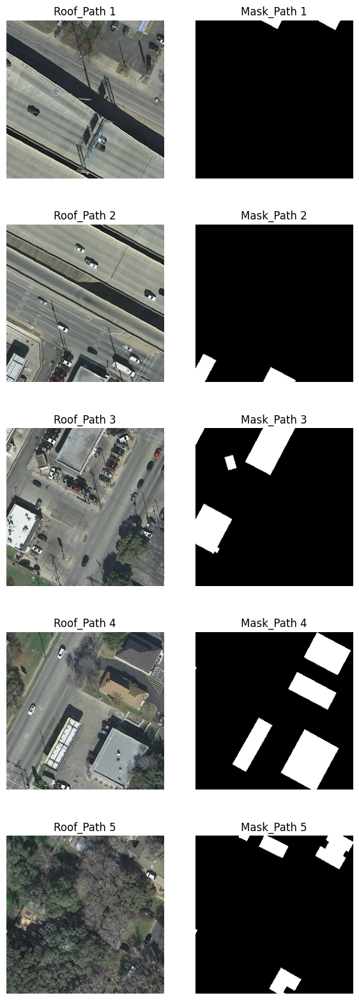

In [9]:
# Test plot of the images

fig, axs = plt.subplots(5, 2, figsize=(7, 20))

for i in range(5):
    img=Image.open(df_sorted['roof_path'].iloc[i])

    # Convert the image to RGB format if it's not already in RGB
    if img.mode != "RGB":
        img = img.convert("RGB")

    # Convert the image to a NumPy array
    img_array = np.array(img)
    axs[i,0].imshow(img_array)
    axs[i,0].axis('off')
    axs[i,0].set_title(f'Roof_Path {i+1}')

    img_mask=Image.open(df_sorted['mask_path'].iloc[i])

    # Convert the image to RGB format if it's not already in RGB
    if img.mode != "RGB":
        img = img.convert("RGB")

    # Convert the image to a NumPy array
    img_mask_array = np.array(img_mask)
    axs[i,1].imshow(img_mask_array, cmap='gray')
    axs[i,1].axis('off')
    axs[i,1].set_title(f'Mask_Path {i+1}')


# Exploratory Data Analysis - Distribution of Training, Test, and Validation Datasets

In [10]:
import re
import seaborn as sns

# Define a function to extract city names
def extract_city_name(city_with_number):
    match = re.match(r'([a-zA-Z]+)', city_with_number)
    if match:
        return match.group(1)
    else:
        return None

# Define a function to plot the distribution
def plot_distribution(df, title):
    # Sorted list of city names with numbers#
    city_names_with_numbers = df.sort_index().index

    # Apply the function to each city name with a number
    city_names_only = [extract_city_name(city) for city in city_names_with_numbers]

    # Remove None values (in case there are any)
    city_names_only = [city for city in city_names_only if city is not None]

    city, counts = np.unique(city_names_only, return_counts=True)
    sns.barplot(x=city, y=counts)
    plt.title(f'City distribution of {title} dataset')
    print(city, counts) # Just to show the statistics


['austin' 'chicago' 'kitsap' 'tyrol' 'vienna'] [2125 2140 2174 2191 2170]


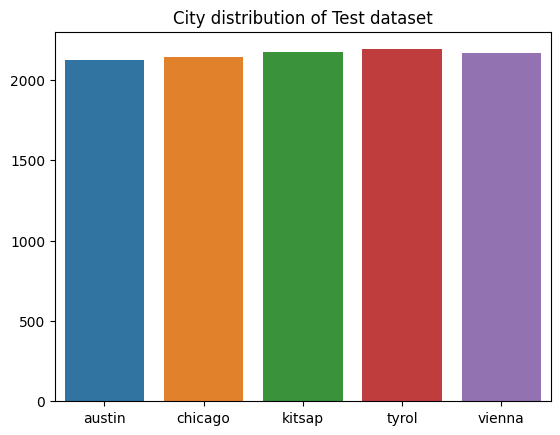

In [11]:
plot_distribution(X_test, "Test")

['austin' 'chicago' 'kitsap' 'tyrol' 'vienna'] [10460 10429 10427 10372 10332]


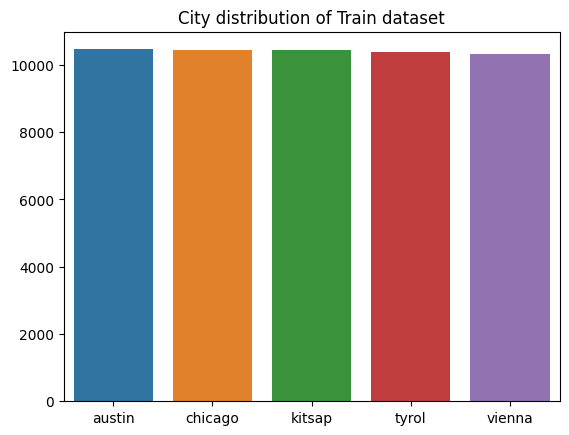

In [12]:
plot_distribution(train_df, "Train")

['austin' 'chicago' 'kitsap' 'tyrol' 'vienna'] [1815 1831 1799 1837 1898]


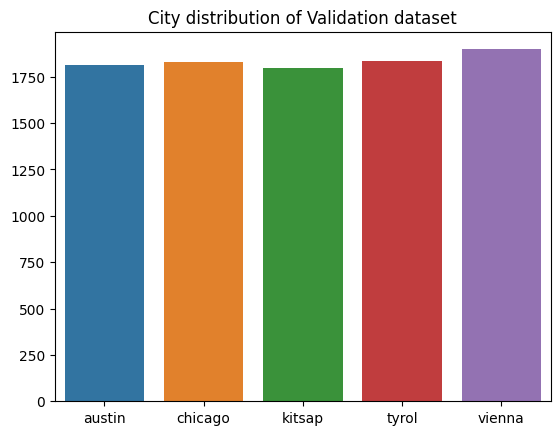

In [13]:
plot_distribution(valid_df, "Validation")

In [14]:
# Create functions for the tensorflow dataset
img_size=(250,250)

# Use this function only if there are not enough images
def data_augmentation(solar_img, mask_img):
    if tf.random.uniform(()) > 0.5:
        solar_img = tf.image.flip_left_right(solar_img)
        mask_img = tf.image.flip_left_right(mask_img)

def preprocessing(solar_path, mask_path, vgg16 = False):
    solar_img = tf.io.read_file(solar_path)
    solar_img = tf.image.decode_image(solar_img, channels=3, dtype=tf.float32,expand_animations=False)
    if vgg16:
        solar_img = tf.image.resize(solar_img,(224,224))
        #solar_img = preprocess_input(solar_img)
    else:
        solar_img = tf.image.resize(solar_img,img_size)
    solar_img = tf.cast(solar_img, tf.float32) / 255.0 # Normalize the layers
    
    # Mask image
    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_image(mask_img, channels=1, dtype=tf.float32,expand_animations=False)
    if vgg16:
        mask_img = tf.image.resize(mask_img,(224,224))
    else:
        mask_img = tf.image.resize(mask_img,img_size)
    mask_img = mask_img[:,:,:1]
    mask_img = tf.math.sign(mask_img)

    return solar_img, mask_img

def create_dataset(df, vgg16 = False):
    ds = tf.data.Dataset.from_tensor_slices((df["roof_path"].values, df["mask_path"].values))
    ds = ds.map((lambda x, y: preprocessing(x, y, vgg16=vgg16)), tf.data.AUTOTUNE)
    
    return ds

def display(display_list):
    plt.figure(figsize=(5, 10))
    title = ['Input Image', 'True Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap='gray')
        plt.axis('off')
    plt.show()

def display_pred(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]), cmap='gray')
        plt.axis('off')
    plt.show()

In [15]:
train_length = len(train_df)
batch_size = 30
buffer_size = 1000

In [16]:
# Create the tensor datasets for train, test and validation datasets
train = create_dataset(train_df)
valid = create_dataset(valid_df)
test = create_dataset(X_test)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


2023-12-07 07:21:18.586544: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-07 07:21:20.110568: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20613 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:00:03.0, compute capability: 8.9


Text(0, 0.5, 'Count of Images')

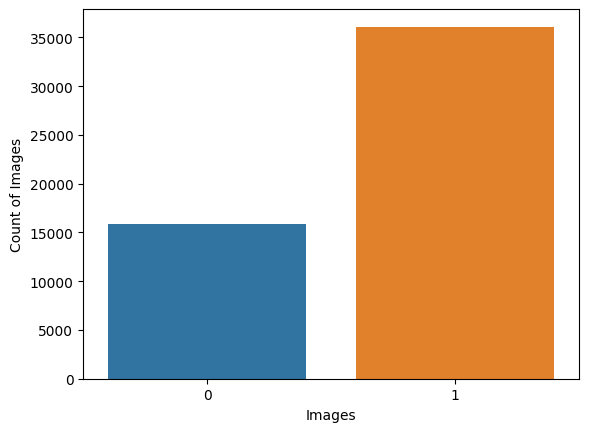

In [17]:
# Get the distribution of images with roof and no roof for the training data
mask_img = []
for img, mask in train.take(len(train_df)):
    sample_image, sample_mask = img, mask
    mk = 1 if np.sum(sample_mask) > 0 else 0
    mask_img.append(mk)

img_mask, count = np.unique(mask_img, return_counts=True)
sns.barplot(x=img_mask, y=count)
plt.xlabel('Images')
plt.ylabel('Count of Images')

In [18]:
baseline_roof = pd.Series(mask_img).value_counts(normalize=True).max()
print(f'Baseline of images with roof (frequency of images with roof): {baseline_roof: .2%}')

Baseline of images with roof (frequency of images with roof):  69.40%


In [19]:
# Function to check the image pixel distribution
def img_dist(tf, df):
    dist_mask = []
    for img, mask in tf.take(len(df)):
        sample_image, sample_mask = img, mask
        dist_mask.append(np.sum(sample_mask))
    
    # Compute total and the percentage
    sum_dist = np.sum(dist_mask)
    perc_dist = sum_dist/(250 * 250 * len(dist_mask))
    
    return dist_mask, sum_dist, perc_dist

Total number of pixels with images is: 512217952.0
Percentage of pixels with roof: 15.75%


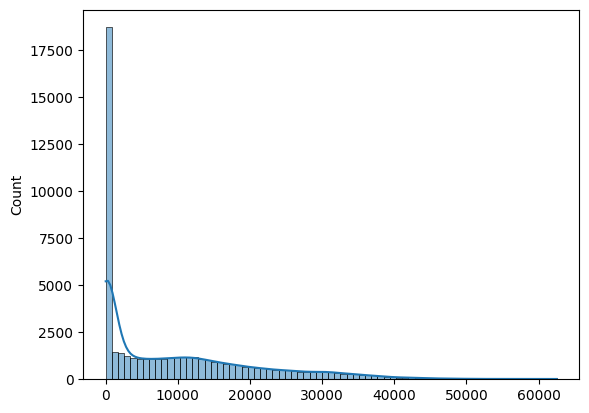

In [20]:
# Check the training image distribution
train_img_dist, sum_dist, perc_dist = img_dist(train, train_df)
print(f'Total number of pixels with images is: {sum_dist}\nPercentage of pixels with roof: {perc_dist:.2%}')
sns.histplot(train_img_dist, kde=True);

Total number of pixels with images is: 106633968.0
Percentage of pixels with roof: 15.80%


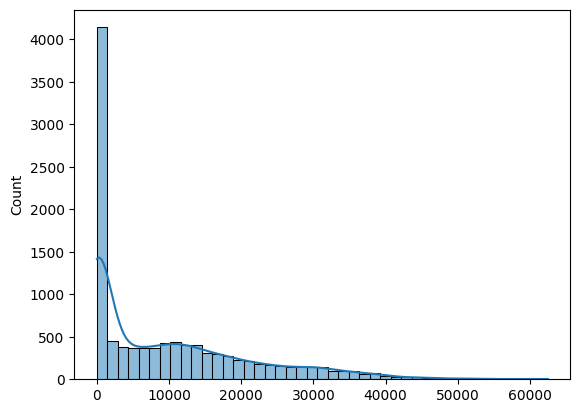

In [26]:
# Check the test image distribution
test_img_dist, ts_sum_dist, ts_perc_dist = img_dist(test, X_test)
print(f'Total number of pixels with images is: {ts_sum_dist}\nPercentage of pixels with roof: {ts_perc_dist:.2%}')
sns.histplot(test_img_dist, kde=True);

Total number of pixels with images is: 91363344.0
Percentage of pixels with roof: 15.92%


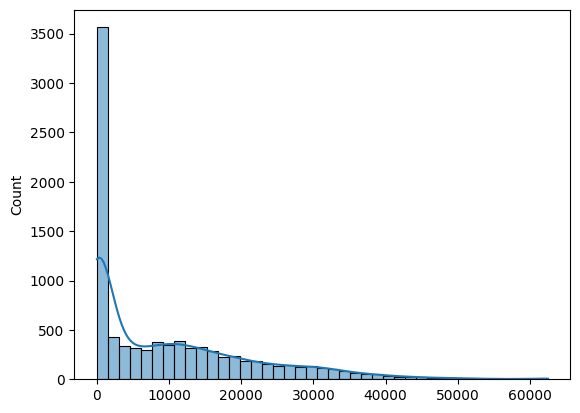

In [28]:
# Check the validation image distribution
valid_img_dist, v_sum_dist, v_perc_dist = img_dist(valid, valid_df)
print(f'Total number of pixels with images is: {v_sum_dist}\nPercentage of pixels with roof: {v_perc_dist:.2%}')
sns.histplot(valid_img_dist, kde=True);

In [29]:
baseline = perc_dist
print(f'Accuracy baseline score (pixels with roof): {baseline: .2%}')

Accuracy baseline score (pixels with roof):  15.75%


In [31]:
#Compute the BinaryIoU score
baseline_bIoU = tf.keras.metrics.BinaryIoU(target_class_ids=[0, 1], threshold=0.5)

target = np.array(train_img_dist)/(250 * 250)

# Calculate the mean value of the target
mean_target = np.mean(target)

# Create a constant prediction array
const_pred = np.full_like(target, mean_target)

baseline_bIoU.update_state(target, const_pred)
print(f'The baseline BinaryIoU score is {baseline_bIoU.result().numpy():.4f}')

The baseline BinaryIoU score is 0.4996


In [20]:
# Create the batches of train, validation and test datasets from the tensors
train_dataset = train.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(batch_size)
test_dataset = test.batch(batch_size)

In [21]:
train_dataset

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 250, 250, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 250, 250, 1), dtype=tf.float32, name=None))>

In [34]:
test_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 250, 250, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 250, 250, 1), dtype=tf.float32, name=None))>

In [35]:
valid_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 250, 250, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 250, 250, 1), dtype=tf.float32, name=None))>

In [22]:
def plot_history(history, title='', axs=None, exp_name=""):
    if axs is not None:
        ax1, ax2 = axs
    else:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    if len(exp_name) > 0 and exp_name[0] != '_':
        exp_name = '_' + exp_name
    ax1.plot(history.history['loss'], label = 'train' + exp_name)
    ax1.plot(history.history['val_loss'], label = 'val' + exp_name)
    ax1.set_ylim(0., 2.2)
    ax1.set_title('loss')
    ax1.legend()

    ax2.plot(history.history['accuracy'], label='train accuracy'  + exp_name)
    ax2.plot(history.history['val_accuracy'], label='val accuracy'  + exp_name)
    ax2.set_ylim(0.25, 1.)
    ax2.set_title('Accuracy')
    ax2.legend()
    return (ax1, ax2)

In [23]:
# Function to predict and display the predictions alongside with the true data
def pred(model, dataset, batch_size, threshold, num=1):
    # store the predicted values in a temporary dataset
    temp=[]
    for img, mask in dataset.take(num):
        img_pred = model.predict(img)
        for i in range(batch_size):
            temp.append(img_pred[i])

    # Mask the predicted output
    temp = np.array(temp)
    temp[temp >= threshold] = 1
    temp[temp < threshold] = 0

    # Display 5 predicted images
    for i in range(3):
        display_pred([img[i], mask[i], temp[i]])

In [24]:
# Formatted model name
from datetime import datetime

def savemodel(model):
    current_datetime = datetime.now()
    
    # Create a file format
    formatted_datetime = current_datetime.strftime("%Y-%m-%d_%H-%M-%S")

    # Save the model in the current working directory
    model.save(f"model_{formatted_datetime}.h5")

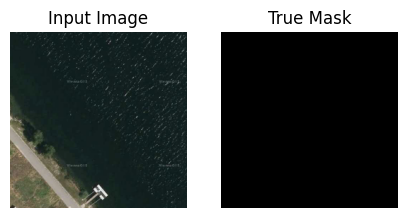

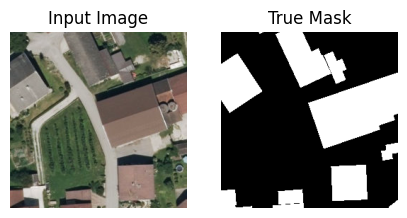

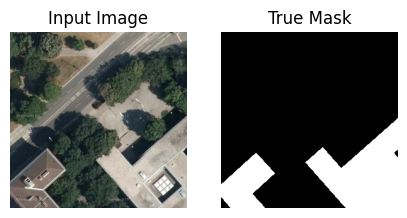

In [25]:
# Let's look at some image and their corresponding mask from the tensor dataset

for image, mask in train.take(3):
    sample_image, sample_mask = image, mask
    display([sample_image, sample_mask])

# Models Creation and Evaluation

## Define Hyperparameters and Metrics

In [26]:
from tensorflow.keras.losses import binary_crossentropy
# Define the learning rate
lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.00001, verbose=1)

# Define the metrics for our model
metric = ['accuracy', tf.keras.metrics.BinaryIoU(target_class_ids=[0, 1], threshold=0.5)]

# Define Dice Loss Function
def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

# Custom Loss Function Combining Binary Crossentropy and Dice Loss
def combined_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

In [27]:
# Define learning rate scheduler at every 10 epochs
def lr_sched(epoch, lr):
    if epoch % 10 == 0 and epoch > 0:
        return lr * 0.1
    return lr

## Define and evaluate a small and Large U-Net models

In [28]:
# Creating first simple U-Net Model

from tensorflow.keras import layers, models
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Input shape
input_shape = (250, 250, 3)

# Define the U-Net model with reduced parameters (light model)
def unet_model(input_shape):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    # Bottleneck
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv2)

    # Decoder
    up3 = layers.UpSampling2D(size=(2, 2))(conv2)
    concat3 = layers.Concatenate()([conv1, up3])
    conv3 = layers.Conv2D(32, 3, activation='relu', padding='same')(concat3)
    conv3 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv3)

    # Output layer
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv3)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet_model(input_shape)

# Display the model summary
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 250, 250, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 250, 250, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

In [120]:
model.compile(optimizer="adam",loss="binary_crossentropy",metrics=metric)

In [146]:
# Test run with simple model created
EPOCHS = 30
STEPS_PER_EPOCH = train_length // batch_size

es = tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_accuracy', restore_best_weights=True)

history=model.fit(train_dataset,
                  epochs=EPOCHS,
                  steps_per_epoch=STEPS_PER_EPOCH,
                  validation_data=valid_dataset,
                  callbacks=[es],
                  verbose=1)

Epoch 1/30
1734/1734 [==============================] - 327s 188ms/step - loss: 0.2902 - accuracy: 0.8785 - binary_io_u_1: 0.6083 - val_loss: 0.2792 - val_accuracy: 0.8841 - val_binary_io_u_1: 0.6270
Epoch 2/30
1734/1734 [==============================] - 327s 189ms/step - loss: 0.2855 - accuracy: 0.8809 - binary_io_u_1: 0.6165 - val_loss: 0.2785 - val_accuracy: 0.8855 - val_binary_io_u_1: 0.6440
Epoch 3/30
1734/1734 [==============================] - 326s 188ms/step - loss: 0.2835 - accuracy: 0.8821 - binary_io_u_1: 0.6203 - val_loss: 0.2759 - val_accuracy: 0.8865 - val_binary_io_u_1: 0.6471
Epoch 4/30
1734/1734 [==============================] - 328s 189ms/step - loss: 0.2801 - accuracy: 0.8838 - binary_io_u_1: 0.6255 - val_loss: 0.2761 - val_accuracy: 0.8868 - val_binary_io_u_1: 0.6512
Epoch 5/30
1734/1734 [==============================] - 326s 188ms/step - loss: 0.2778 - accuracy: 0.8851 - binary_io_u_1: 0.6294 - val_loss: 0.2746 - val_accuracy: 0.8869 - val_binary_io_u_1: 0.6527


In [149]:
# Predict a batch set of 30 images
#pred(model, test_dataset, batch_size, 0.5, 1)

model.evaluate(test_dataset)

360/360 [==============================] - 21s 58ms/step - loss: 0.2547 - accuracy: 0.8950 - binary_io_u_1: 0.6533


[0.25468572974205017, 0.8949595093727112, 0.6533187627792358]

In [ ]:
pred(model, test_dataset, batch_size, 0.5, 1)

In [167]:
# Save the model
model.save('models/Model_30epochs_small.h5')

In [152]:
# Save the history to a file
with open('trainHistoryDict/history_simple', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

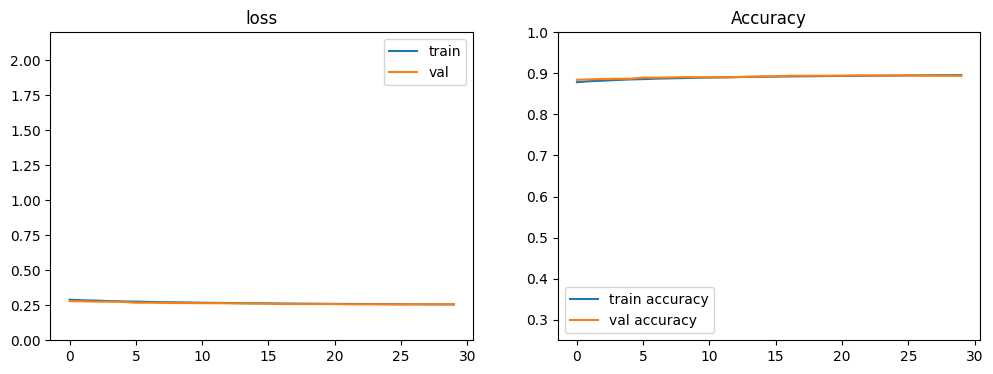

In [151]:
plot_history(history);

In [199]:
# Design a complex U-Net model larger depth

def unet_model_c(input_shape=(250, 250, 3)):
    inputs = tf.keras.Input(shape=input_shape)
 
    # Encoder
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
 
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
 
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)
 
    # Bottleneck
    conv4 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv4)
 
    # Decoder
    up5 = layers.UpSampling2D(size=(2, 2))(conv4)
    concat5 = layers.Concatenate()([conv3, up5])
    conv5 = layers.Conv2D(128, 3, activation='relu', padding='same')(concat5)
    conv5 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv5)
 
    up6 = layers.UpSampling2D(size=(2, 2))(conv5)
    pad6 = layers.ZeroPadding2D(padding=((1, 0), (1, 0)))(up6)  # Pad to match dimensions
    concat6 = layers.Concatenate()([conv2, pad6])
    conv6 = layers.Conv2D(64, 3, activation='relu', padding='same')(concat6)
    conv6 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv6)
 
    up7 = layers.UpSampling2D(size=(2, 2))(conv6)
    concat7 = layers.Concatenate()([conv1, up7])
    conv7 = layers.Conv2D(32, 3, activation='relu', padding='same')(concat7)
    conv7 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv7)
 
    # Output layer
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv7)
 
    model = models.Model(inputs=inputs, outputs=outputs)
    return model
 
# Create the U-Net model
model_c = unet_model_c()
 
# Display the model summary
model_c.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_67 (Conv2D)             (None, 250, 250, 32  896         ['input_8[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_68 (Conv2D)             (None, 250, 250, 32  9248        ['conv2d_67[0][0]']              
                                )                                                           

In [204]:
# Combine the model
model_c.compile(optimizer="adam",loss=combined_loss,metrics=metric)

In [ ]:
EPOCHS = 30
STEPS_PER_EPOCH = train_length // batch_size

es = tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_accuracy', restore_best_weights=True)

checkpoint_filepath =os.path.join(os.getcwd(),"checkpoints/model_c")
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

history=model_c.fit(train_dataset,
                  epochs=EPOCHS,
                  steps_per_epoch=STEPS_PER_EPOCH,
                  validation_data=valid_dataset,
                  callbacks=[es, model_checkpoint_callback],
                  verbose=1)

Epoch 1/30
1734/1734 [==============================] - ETA: 0s - loss: 0.8981 - accuracy: 0.8607 - binary_io_u_6: 0.6011

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 559s 318ms/step - loss: 0.8981 - accuracy: 0.8607 - binary_io_u_6: 0.6011 - val_loss: 0.7025 - val_accuracy: 0.8900 - val_binary_io_u_6: 0.6774
Epoch 2/30
1734/1734 [==============================] - ETA: 0s - loss: 0.6465 - accuracy: 0.9001 - binary_io_u_6: 0.7001

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 551s 318ms/step - loss: 0.6465 - accuracy: 0.9001 - binary_io_u_6: 0.7001 - val_loss: 0.5901 - val_accuracy: 0.9127 - val_binary_io_u_6: 0.7200
Epoch 3/30
1734/1734 [==============================] - ETA: 0s - loss: 0.5723 - accuracy: 0.9127 - binary_io_u_6: 0.7310

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 550s 317ms/step - loss: 0.5723 - accuracy: 0.9127 - binary_io_u_6: 0.7310 - val_loss: 0.5501 - val_accuracy: 0.9196 - val_binary_io_u_6: 0.7372
Epoch 4/30
1734/1734 [==============================] - ETA: 0s - loss: 0.5334 - accuracy: 0.9191 - binary_io_u_6: 0.7474

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 551s 318ms/step - loss: 0.5334 - accuracy: 0.9191 - binary_io_u_6: 0.7474 - val_loss: 0.5324 - val_accuracy: 0.9227 - val_binary_io_u_6: 0.7453
Epoch 5/30
1734/1734 [==============================] - ETA: 0s - loss: 0.5086 - accuracy: 0.9232 - binary_io_u_6: 0.7583

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 550s 317ms/step - loss: 0.5086 - accuracy: 0.9232 - binary_io_u_6: 0.7583 - val_loss: 0.5044 - val_accuracy: 0.9263 - val_binary_io_u_6: 0.7585
Epoch 6/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4877 - accuracy: 0.9266 - binary_io_u_6: 0.7674

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 549s 317ms/step - loss: 0.4877 - accuracy: 0.9266 - binary_io_u_6: 0.7674 - val_loss: 0.4977 - val_accuracy: 0.9274 - val_binary_io_u_6: 0.7610
Epoch 7/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4716 - accuracy: 0.9292 - binary_io_u_6: 0.7745

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 548s 316ms/step - loss: 0.4716 - accuracy: 0.9292 - binary_io_u_6: 0.7745 - val_loss: 0.4842 - val_accuracy: 0.9291 - val_binary_io_u_6: 0.7678
Epoch 8/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4555 - accuracy: 0.9318 - binary_io_u_6: 0.7816

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 547s 315ms/step - loss: 0.4555 - accuracy: 0.9318 - binary_io_u_6: 0.7816 - val_loss: 0.4744 - val_accuracy: 0.9303 - val_binary_io_u_6: 0.7721
Epoch 9/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4425 - accuracy: 0.9339 - binary_io_u_6: 0.7874

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 546s 315ms/step - loss: 0.4425 - accuracy: 0.9339 - binary_io_u_6: 0.7874 - val_loss: 0.4722 - val_accuracy: 0.9306 - val_binary_io_u_6: 0.7731
Epoch 10/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4307 - accuracy: 0.9358 - binary_io_u_6: 0.7928

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 546s 315ms/step - loss: 0.4307 - accuracy: 0.9358 - binary_io_u_6: 0.7928 - val_loss: 0.4606 - val_accuracy: 0.9323 - val_binary_io_u_6: 0.7784
Epoch 11/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4209 - accuracy: 0.9375 - binary_io_u_6: 0.7974

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 547s 315ms/step - loss: 0.4209 - accuracy: 0.9375 - binary_io_u_6: 0.7974 - val_loss: 0.4619 - val_accuracy: 0.9327 - val_binary_io_u_6: 0.7778
Epoch 12/30
1734/1734 [==============================] - 542s 313ms/step - loss: 0.4150 - accuracy: 0.9384 - binary_io_u_6: 0.8001 - val_loss: 0.4965 - val_accuracy: 0.9299 - val_binary_io_u_6: 0.7642
Epoch 13/30
1734/1734 [==============================] - ETA: 0s - loss: 0.4092 - accuracy: 0.9393 - binary_io_u_6: 0.8028

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 544s 314ms/step - loss: 0.4092 - accuracy: 0.9393 - binary_io_u_6: 0.8028 - val_loss: 0.4585 - val_accuracy: 0.9342 - val_binary_io_u_6: 0.7800
Epoch 14/30
1734/1734 [==============================] - 542s 313ms/step - loss: 0.4010 - accuracy: 0.9407 - binary_io_u_6: 0.8066 - val_loss: 0.4625 - val_accuracy: 0.9341 - val_binary_io_u_6: 0.7791
Epoch 15/30
1734/1734 [==============================] - ETA: 0s - loss: 0.3928 - accuracy: 0.9421 - binary_io_u_6: 0.8105

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 557s 321ms/step - loss: 0.3928 - accuracy: 0.9421 - binary_io_u_6: 0.8105 - val_loss: 0.4587 - val_accuracy: 0.9345 - val_binary_io_u_6: 0.7810
Epoch 16/30
1734/1734 [==============================] - ETA: 0s - loss: 0.3864 - accuracy: 0.9432 - binary_io_u_6: 0.8136

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 544s 314ms/step - loss: 0.3864 - accuracy: 0.9432 - binary_io_u_6: 0.8136 - val_loss: 0.4412 - val_accuracy: 0.9350 - val_binary_io_u_6: 0.7875
Epoch 17/30
1734/1734 [==============================] - ETA: 0s - loss: 0.3877 - accuracy: 0.9430 - binary_io_u_6: 0.8130

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 543s 313ms/step - loss: 0.3877 - accuracy: 0.9430 - binary_io_u_6: 0.8130 - val_loss: 0.4315 - val_accuracy: 0.9351 - val_binary_io_u_6: 0.7914
Epoch 18/30
1734/1734 [==============================] - ETA: 0s - loss: 0.3839 - accuracy: 0.9435 - binary_io_u_6: 0.8146

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 543s 313ms/step - loss: 0.3839 - accuracy: 0.9435 - binary_io_u_6: 0.8146 - val_loss: 0.4334 - val_accuracy: 0.9360 - val_binary_io_u_6: 0.7908
Epoch 19/30
1734/1734 [==============================] - 541s 312ms/step - loss: 0.3736 - accuracy: 0.9452 - binary_io_u_6: 0.8194 - val_loss: 0.4534 - val_accuracy: 0.9350 - val_binary_io_u_6: 0.7831
Epoch 20/30
1734/1734 [==============================] - ETA: 0s - loss: 0.3680 - accuracy: 0.9462 - binary_io_u_6: 0.8223

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 543s 313ms/step - loss: 0.3680 - accuracy: 0.9462 - binary_io_u_6: 0.8223 - val_loss: 0.4302 - val_accuracy: 0.9361 - val_binary_io_u_6: 0.7924
Epoch 21/30
1734/1734 [==============================] - 540s 312ms/step - loss: 0.3693 - accuracy: 0.9459 - binary_io_u_6: 0.8215 - val_loss: 0.4296 - val_accuracy: 0.9358 - val_binary_io_u_6: 0.7930
Epoch 22/30
1734/1734 [==============================] - 540s 311ms/step - loss: 0.3673 - accuracy: 0.9462 - binary_io_u_6: 0.8224 - val_loss: 0.4542 - val_accuracy: 0.9353 - val_binary_io_u_6: 0.7830
Epoch 23/30
1734/1734 [==============================] - 540s 311ms/step - loss: 0.3648 - accuracy: 0.9466 - binary_io_u_6: 0.8236 - val_loss: 0.4635 - val_accuracy: 0.9347 - val_binary_io_u_6: 0.7800
Epoch 24/30
1734/1734 [==============================] - 539s 311ms/step - loss: 0.3623 - accuracy: 0.9470 - binary_io_u_6: 0.8249 - val_loss: 0.4571 - val_accuracy: 0.9353 - val_binary_io_u_6: 0.7829
Epoch 2

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_c/assets


1734/1734 [==============================] - 543s 313ms/step - loss: 0.3568 - accuracy: 0.9480 - binary_io_u_6: 0.8276 - val_loss: 0.4470 - val_accuracy: 0.9361 - val_binary_io_u_6: 0.7871
Epoch 26/30
1734/1734 [==============================] - 540s 312ms/step - loss: 0.3521 - accuracy: 0.9487 - binary_io_u_6: 0.8297 - val_loss: 0.4498 - val_accuracy: 0.9357 - val_binary_io_u_6: 0.7863
Epoch 27/30
1734/1734 [==============================] - 539s 311ms/step - loss: 0.3502 - accuracy: 0.9490 - binary_io_u_6: 0.8305 - val_loss: 0.4701 - val_accuracy: 0.9339 - val_binary_io_u_6: 0.7791
Epoch 28/30
1734/1734 [==============================] - 539s 311ms/step - loss: 0.3535 - accuracy: 0.9484 - binary_io_u_6: 0.8289 - val_loss: 0.4981 - val_accuracy: 0.9315 - val_binary_io_u_6: 0.7691
Epoch 29/30
1734/1734 [==============================] - 539s 311ms/step - loss: 0.3506 - accuracy: 0.9489 - binary_io_u_6: 0.8302 - val_loss: 0.4889 - val_accuracy: 0.9322 - val_binary_io_u_6: 0.7725
Epoch 3

In [206]:
# Evaluate the complex U-Net model
model_c.evaluate(test_dataset)

360/360 [==============================] - 33s 91ms/step - loss: 0.4754 - accuracy: 0.9371 - binary_io_u_6: 0.7891


[0.475385844707489, 0.9370883107185364, 0.7891279458999634]

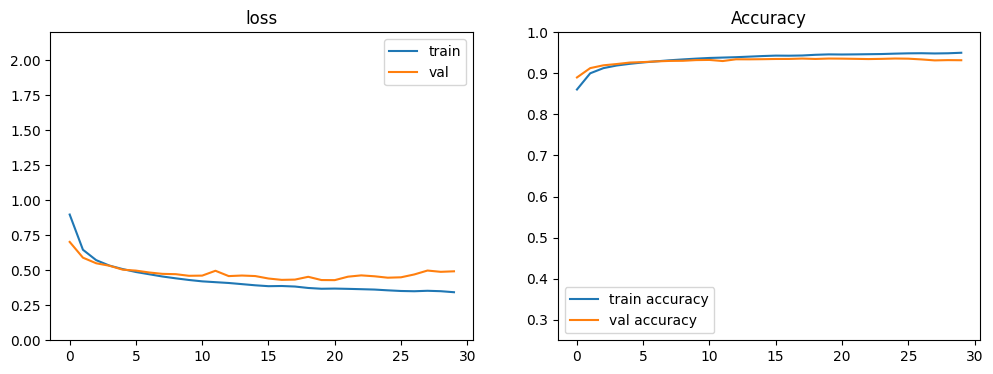

In [210]:
plot_history(history);

In [211]:
# Save the model
model_c.save('models/Model_30epochs_complex_rerun.h5')

# Save the history
with open('trainHistoryDict/history_complex', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

1/1 [==============================] - 0s 44ms/step


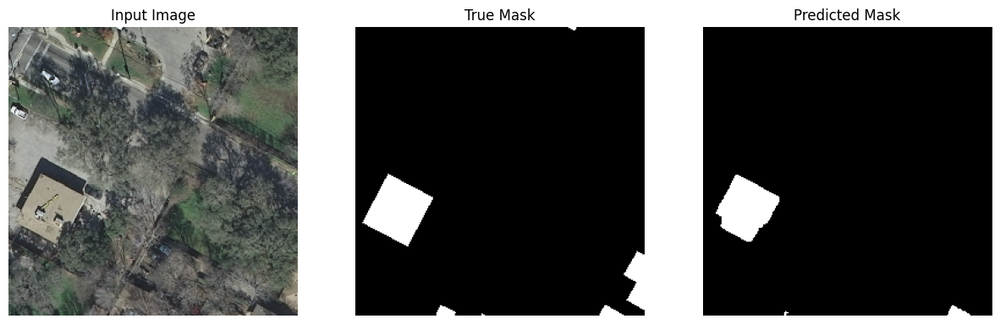

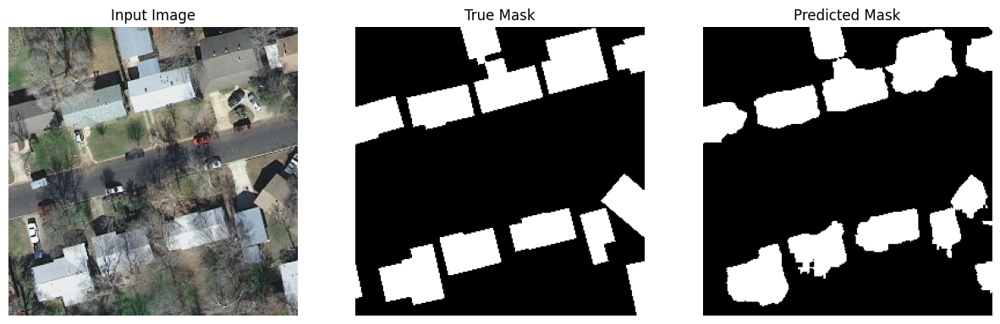

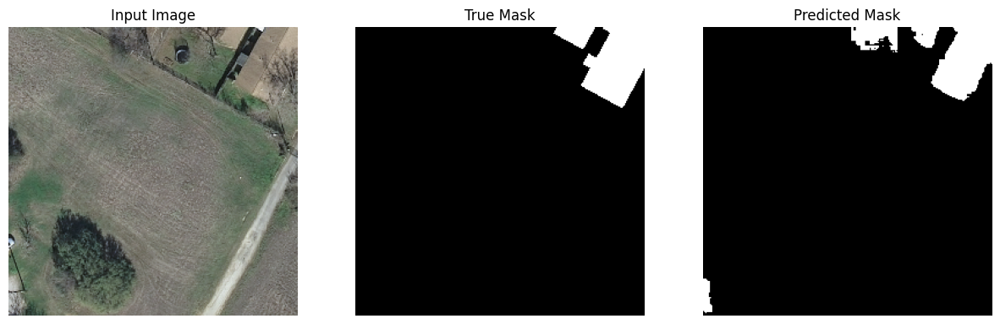

In [208]:
# Predict the test dataset
pred(model_c, test_dataset, batch_size, 0.5, 1)
# Check the unmasked image
#for img, mask in test_dataset.take(1):
#        img_pred = model_c.predict(img)
#        for i in range(3):
#            display_pred([img[i], mask[i], img_pred[i]])

In [ ]:
# Show the shape of the model
tf.keras.utils.plot_model(model_c, show_shapes=True)

## Transfer Learning Models

### Define and evaluate a transfer learning model with MobileNetV2

In [30]:
# Build the U-Net model with MobileNetV2 transfer learning model

import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Concatenate

# Define MobileNetV2 as the backbone
base_model = MobileNetV2(input_shape=(250, 250, 3), include_top=False, weights='imagenet')
base_model.trainable = False

# U-Net model definition
def create_unet_model(input_shape):
    inputs = Input(shape=input_shape)

    # Encoder (MobileNetV2)
    encoder_features = base_model.output #(inputs)
    
    # Decoder
    convT1 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same', activation='relu', name='convT1__')(encoder_features)
    conv1 = Conv2D(128, (3, 3), activation='relu', padding='same', name='conv1__')(convT1)    
    concat1 = Concatenate(axis=-1)([base_model.get_layer('block_10_expand_relu').output, conv1])  # Adjust the layer name as needed

    decoder = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same', activation='relu')(concat1)
    decoder = Conv2D(64, (3, 3), activation='relu', padding='same')(decoder)
    decoder = Concatenate(axis=-1)([decoder, base_model.get_layer('block_4_expand_relu').output])  # Adjust the layer name as needed    
     
    decoder = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = Conv2D(32, (2, 2), activation='relu', padding='valid')(decoder)
    decoder = Concatenate(axis=-1)([decoder, base_model.get_layer('block_3_expand_relu').output])  # Adjust the layer name as needed

    decoder = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = Conv2D(16, (2, 2), activation='relu', padding='valid')(decoder)
    decoder = Concatenate(axis=-1)([decoder, base_model.get_layer('block_1_expand_relu').output])  # Adjust the layer name as needed
    
    decoder = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same', activation='relu')(decoder)
    decoder = Conv2D(16, (2, 2), activation='relu', padding='same')(decoder)
    decoder = Concatenate(axis=-1)([decoder, base_model.input])  # Adjust the layer name as needed
    
    # Output layer
    outputs = Conv2D(1, 1, activation='sigmoid')(decoder)

    model = tf.keras.Model(inputs=base_model.input, outputs=outputs)
    
    return model

# Create the U-Net model with MobileNetV2 backbone
model_p = create_unet_model(input_shape=(250, 250, 3))

# Print model summary
model_p.summary(show_trainable=True)


Model: "model_2"
_____________________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     Trainable  
 input_4 (InputLayer)           [(None, 250, 250, 3  0           []                               N          
                                )]                                                                           
                                                                                                             
 Conv1 (Conv2D)                 (None, 125, 125, 32  864         ['input_4[0][0]']                N          
                                )                                                                            
                                                                                                             
 bn_Conv1 (BatchNormalization)  (None, 125, 125, 32  128         ['Conv1[0][0]']                  N    

In [ ]:
# Load a MobileNetV2 transfer learning model ran with 21 epochs
model_p = load_model('models/model_40epoch_binarycrossentropy.h5')
model_p.summary()

In [116]:
model_p.evaluate(test_dataset) # MobileNetV21 epochs

360/360 [==============================] - 21s 56ms/step - loss: 0.1740 - accuracy: 0.9310 - binary_io_u: 0.7926


[0.173978790640831, 0.9309597611427307, 0.7925510406494141]

1/1 [==============================] - 0s 55ms/step


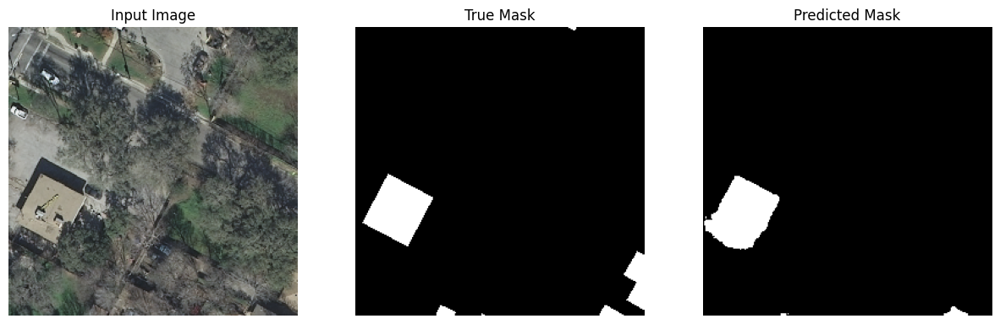

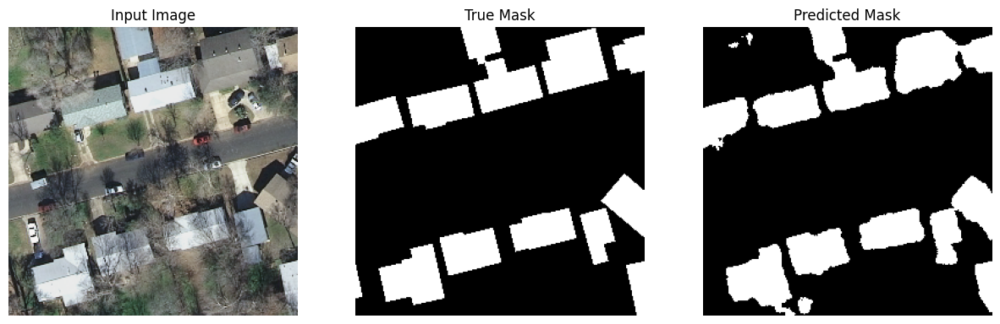

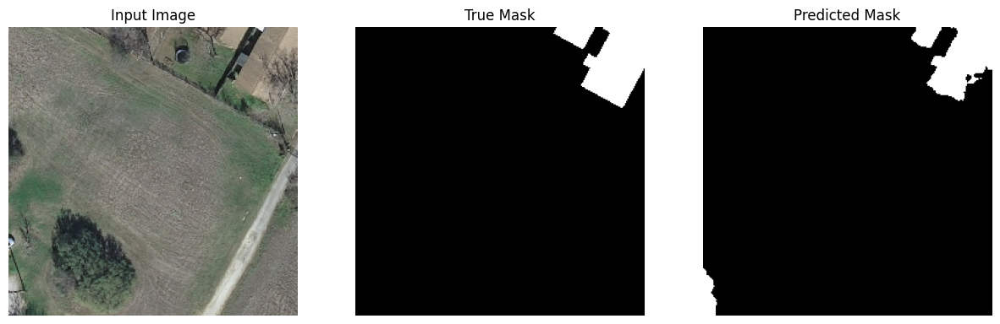

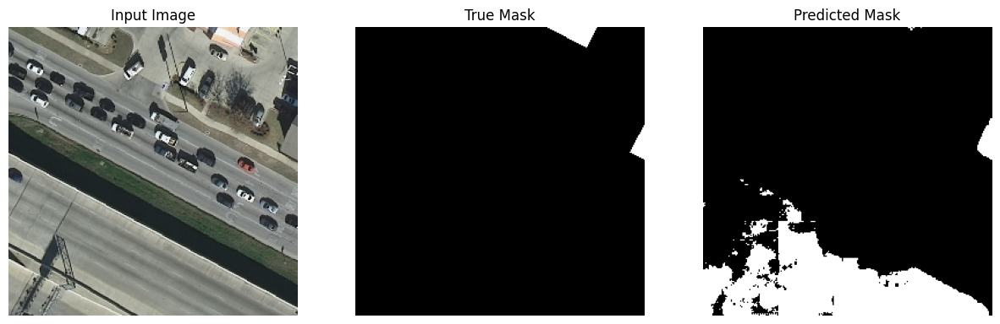

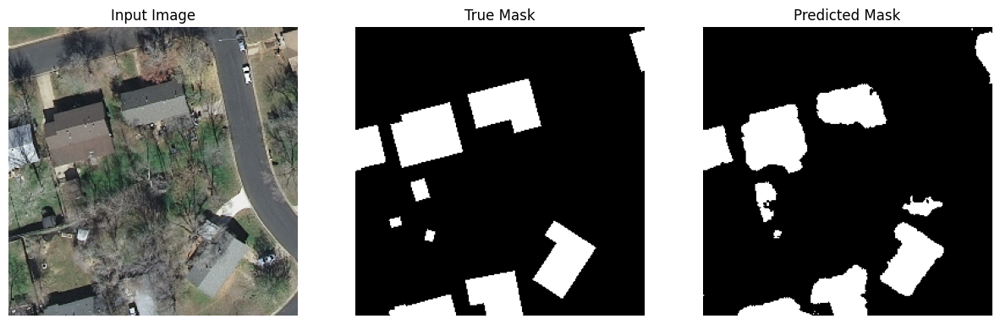

In [59]:
pred(model_p, test_dataset, batch_size, 0.5, 1)

In [113]:
# Load the latest transfer learning model (MobileVNet) with 50 epochs
model_l = load_model('models/model_2023-12-01_16-21-24.h5')
model_l.evaluate(test_dataset)

360/360 [==============================] - 20s 53ms/step - loss: 0.0968 - accuracy: 0.9633 - binary_io_u: 0.8745


[0.09678543359041214, 0.9633404612541199, 0.8745076060295105]

1/1 [==============================] - 0s 47ms/step


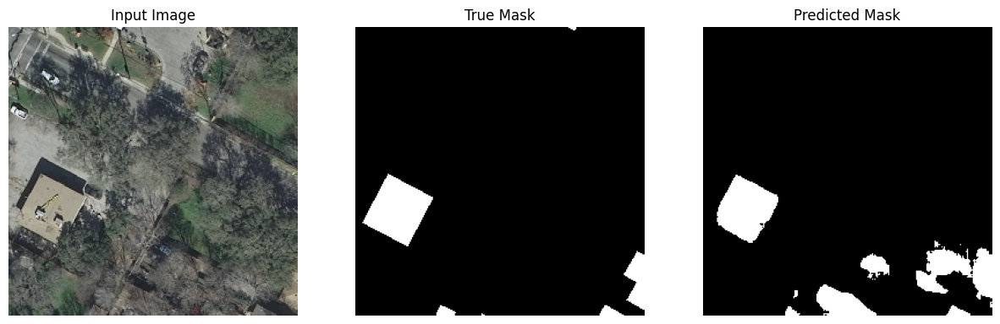

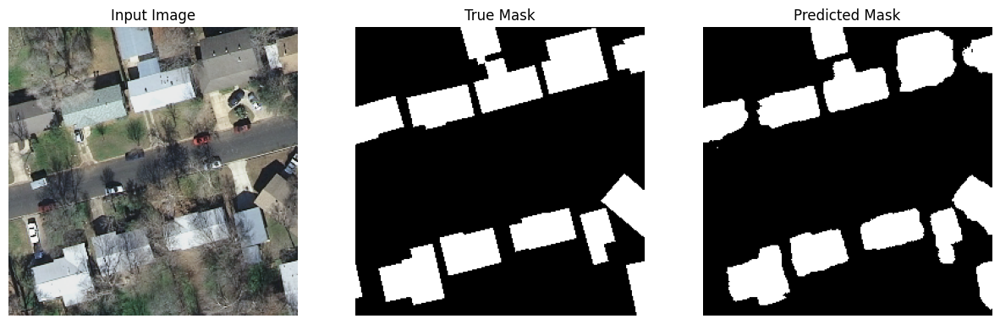

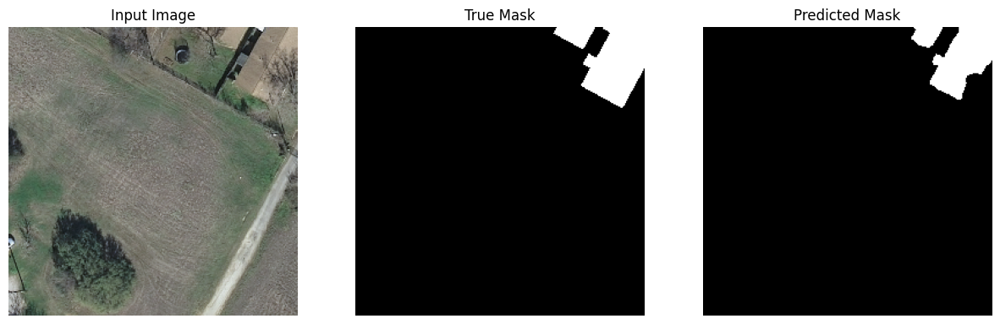

In [192]:
# Check the masked image
pred(model_l, test_dataset, batch_size, 0.5, 1)

# Check the unmasked image
#for img, mask in test_dataset.take(1):
#        img_pred = model_l.predict(img)
#        for i in range(5):
#            display_pred([img[i], mask[i], img_pred[i]])

In [31]:
# Load the (MobileNetV2) transfer learning model with 80 epochs
model_p2 = load_model('models/model_2023-12-04_06-08-14.h5')
model_p2.evaluate(test_dataset)

2023-12-07 07:56:10.404777: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8900


360/360 [==============================] - 28s 56ms/step - loss: 0.0923 - accuracy: 0.9660 - binary_io_u: 0.8818


[0.09233473986387253, 0.9660319685935974, 0.881798267364502]

1/1 [==============================] - 0s 47ms/step


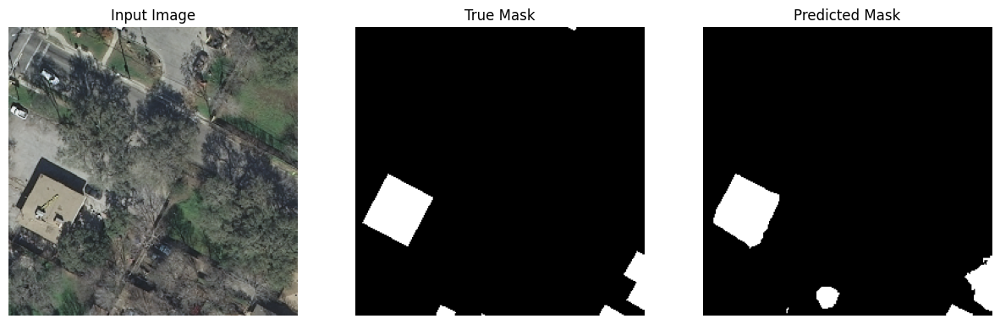

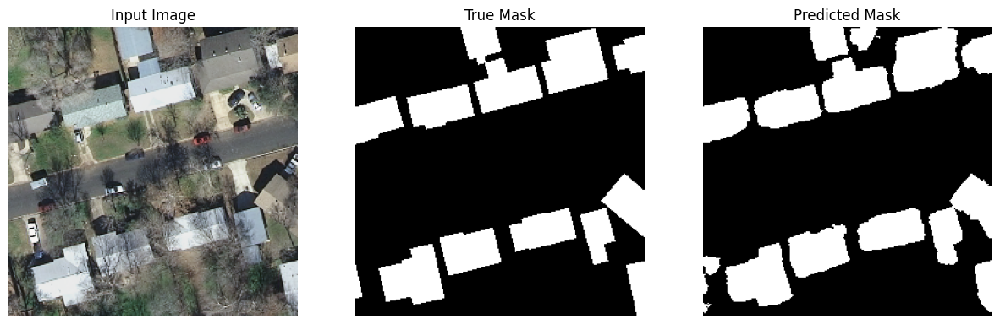

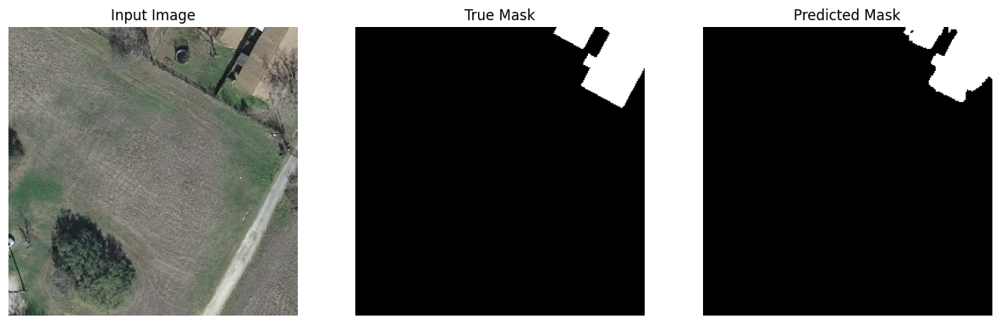

In [191]:
pred(model_p2, test_dataset, batch_size, 0.25, 1)
# Check the unmasked image
#for img, mask in test_dataset.take(1):
#        img_pred = model_p2.predict(img)
#        for i in range(5):
#            display_pred([img[i], mask[i], img_pred[i]])

In [ ]:
# Retrain the MobileNetV2 Model for more epochs

EPOCHS = 30
STEPS_PER_EPOCH = train_length // batch_size

es = tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_accuracy', restore_best_weights=True)

checkpoint_filepath =os.path.join(os.getcwd(),"checkpoints/model_m")
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

history = model_p2.fit(train_dataset,
                  epochs=EPOCHS,
                  steps_per_epoch=STEPS_PER_EPOCH,
                  validation_data=valid_dataset,
                  callbacks=[es, model_checkpoint_callback],
                  verbose=2)


Epoch 1/30


2023-12-07 08:03:15.548585: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f49ac258a60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-12-07 08:03:15.548619: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2023-12-07 08:03:15.595774: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-12-07 08:03:15.977417: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


1734/1734 - 302s - loss: 0.0866 - accuracy: 0.9664 - binary_io_u: 0.8833 - val_loss: 0.2272 - val_accuracy: 0.9121 - val_binary_io_u: 0.7393 - 302s/epoch - 174ms/step
Epoch 2/30


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


1734/1734 - 275s - loss: 0.0766 - accuracy: 0.9699 - binary_io_u: 0.8948 - val_loss: 0.1681 - val_accuracy: 0.9419 - val_binary_io_u: 0.7988 - 275s/epoch - 158ms/step
Epoch 3/30


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


1734/1734 - 275s - loss: 0.0736 - accuracy: 0.9709 - binary_io_u: 0.8980 - val_loss: 0.1377 - val_accuracy: 0.9538 - val_binary_io_u: 0.8392 - 275s/epoch - 159ms/step
Epoch 4/30
1734/1734 - 259s - loss: 0.0718 - accuracy: 0.9715 - binary_io_u: 0.9002 - val_loss: 0.1918 - val_accuracy: 0.9423 - val_binary_io_u: 0.8015 - 259s/epoch - 149ms/step
Epoch 5/30


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


1734/1734 - 276s - loss: 0.0717 - accuracy: 0.9715 - binary_io_u: 0.9000 - val_loss: 0.1057 - val_accuracy: 0.9610 - val_binary_io_u: 0.8653 - 276s/epoch - 159ms/step
Epoch 6/30
1734/1734 - 255s - loss: 0.0691 - accuracy: 0.9725 - binary_io_u: 0.9033 - val_loss: 0.2428 - val_accuracy: 0.9314 - val_binary_io_u: 0.7685 - 255s/epoch - 147ms/step
Epoch 7/30
1734/1734 - 255s - loss: 0.0682 - accuracy: 0.9728 - binary_io_u: 0.9043 - val_loss: 0.1499 - val_accuracy: 0.9506 - val_binary_io_u: 0.8408 - 255s/epoch - 147ms/step
Epoch 8/30
1734/1734 - 255s - loss: 0.0687 - accuracy: 0.9726 - binary_io_u: 0.9036 - val_loss: 0.2531 - val_accuracy: 0.9236 - val_binary_io_u: 0.7481 - 255s/epoch - 147ms/step
Epoch 9/30


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_m/assets


1734/1734 - 274s - loss: 0.0677 - accuracy: 0.9729 - binary_io_u: 0.9047 - val_loss: 0.1058 - val_accuracy: 0.9621 - val_binary_io_u: 0.8698 - 274s/epoch - 158ms/step
Epoch 10/30
1734/1734 - 255s - loss: 0.0654 - accuracy: 0.9738 - binary_io_u: 0.9076 - val_loss: 0.3052 - val_accuracy: 0.9173 - val_binary_io_u: 0.7362 - 255s/epoch - 147ms/step
Epoch 11/30
1734/1734 - 255s - loss: 0.0680 - accuracy: 0.9728 - binary_io_u: 0.9043 - val_loss: 0.1732 - val_accuracy: 0.9423 - val_binary_io_u: 0.8208 - 255s/epoch - 147ms/step
Epoch 12/30


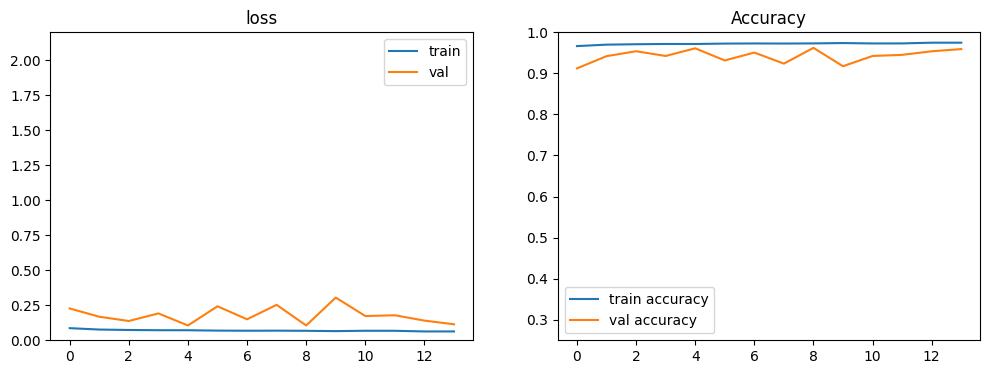

In [35]:
plot_history(history);

In [36]:
# Save history, evaluate the model with the test data

# Save the history to a file
with open('trainHistoryDict/history_MobileNetV2', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

# Evaluate the  model
model_p2.evaluate(test_dataset)

360/360 [==============================] - 18s 50ms/step - loss: 0.1050 - accuracy: 0.9623 - binary_io_u: 0.8697


[0.10502489656209946, 0.9622748494148254, 0.8697410821914673]

1/1 [==============================] - 0s 44ms/step


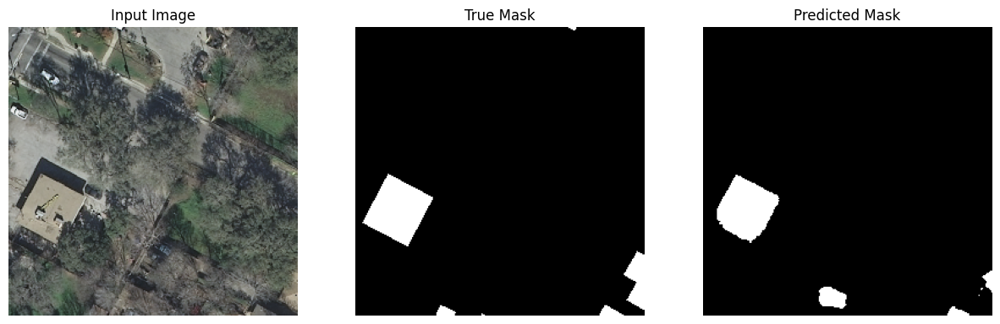

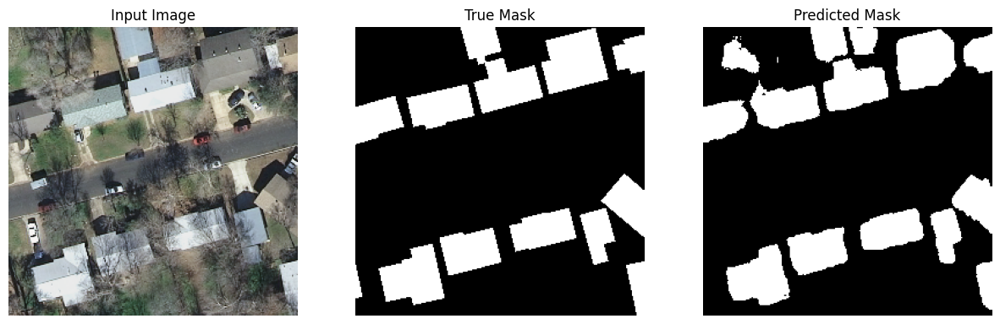

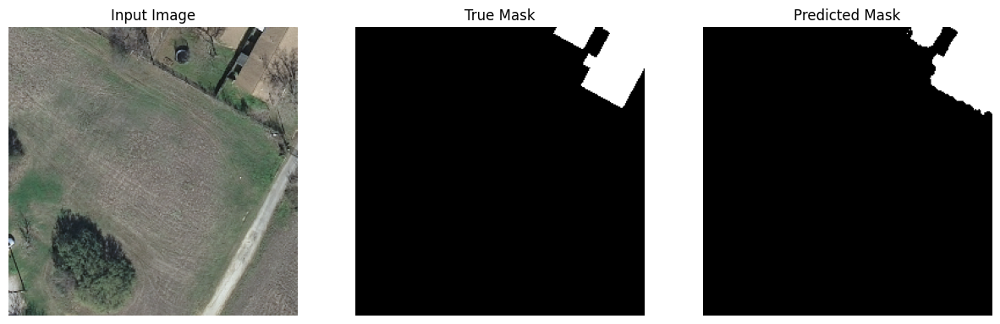

In [39]:
# Predict the test data
pred(model_p2, test_dataset, batch_size, 0.5, 1)

# Save the model
model_p2.save('models/Model_MobileNetV2.h5')

### Define and evaluate U-Net Model with VGG16 Transfer Learning

In [33]:
# Define a new U-Net Model with all the necessary parameters
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16

# Define the U-Net model with VGG16 transfer learning
def unet_vgg16(input_shape=(250, 250, 3)):
    # Load pre-trained VGG16 model (excluding top layers)
    vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the layers of the VGG16 model
    for layer in vgg16_base.layers:
        layer.trainable = False
    
    # Expanding Path (Decoder)
    up1 = layers.UpSampling2D(size=(2, 2))(vgg16_base.get_layer('block5_conv3').output)
    pad1 = layers.ZeroPadding2D(padding=((1, 0), (1, 0)))(up1)
    concat1 = layers.Concatenate()([vgg16_base.get_layer('block4_conv3').output, pad1])
    conv1 = layers.Conv2D(512, 3, activation='relu', padding='same')(concat1)
    conv1 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv1)

    up2 = layers.UpSampling2D(size=(2, 2))(conv1)
    concat2 = layers.Concatenate()([vgg16_base.get_layer('block3_conv3').output, up2])
    conv2 = layers.Conv2D(256, 3, activation='relu', padding='same')(concat2)
    conv2 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv2)

    up3 = layers.UpSampling2D(size=(2, 2))(conv2)
    pad3 = layers.ZeroPadding2D(padding=((1, 0), (1, 0)))(up3)
    concat3 = layers.Concatenate()([vgg16_base.get_layer('block2_conv2').output, pad3])
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(concat3)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv3)

    up4 = layers.UpSampling2D(size=(2, 2))(conv3)
    concat4 = layers.Concatenate()([vgg16_base.get_layer('block1_conv2').output, up4])
    conv4 = layers.Conv2D(64, 3, activation='relu', padding='same')(concat4)
    conv4 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv4)

    # Output layer
    output = layers.Conv2D(1, 1, activation='sigmoid')(conv4)

    # Create the U-Net model
    model = models.Model(inputs=vgg16_base.input, outputs=output)

    return model

# Create the U-Net model with VGG16 transfer learning
unet_model = unet_vgg16()

# Compile the model
unet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=metric)

# Display the model summary
unet_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 250, 250, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 250, 250, 64  1792        ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 250, 250, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [27]:
# Fit the model with 2 epochs to test it
EPOCHS = 2
STEPS_PER_EPOCH = train_length // batch_size

history=unet_model.fit(train_dataset,
                  epochs=EPOCHS,
                  steps_per_epoch=STEPS_PER_EPOCH,
                  validation_data=valid_dataset,
                  verbose=1)

Epoch 1/2


/opt/conda/envs/tensorflow/lib/python3.10/site-packages/keras/backend.py:5676: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


1734/1734 [==============================] - 1103s 630ms/step - loss: 0.4452 - accuracy: 0.8421 - binary_io_u_1: 0.4211 - val_loss: 0.4386 - val_accuracy: 0.8408 - val_binary_io_u_1: 0.4204
Epoch 2/2
1734/1734 [==============================] - 1088s 628ms/step - loss: 0.4378 - accuracy: 0.8425 - binary_io_u_1: 0.4212 - val_loss: 0.4394 - val_accuracy: 0.8408 - val_binary_io_u_1: 0.4204


In [ ]:
# Check the unmasked image
for img, mask in test_dataset.take(1):
        img_pred = unet_model.predict(img)
        for i in range(5):
            display_pred([img[i], mask[i], img_pred[i]])

In [ ]:
# Fine tune the model with reduced learning rate for 10 epochs
unet_model.trainable = True

unet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # Very low learning rate
              loss="binary_crossentropy",
              metrics=metric)

early_stop = tf.keras.callbacks.EarlyStopping(patience=4,restore_best_weights=True)

checkpoint_filepath =os.path.join(os.getcwd(),"checkpoints/model_unet")
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

EPOCHS = 10
STEPS_PER_EPOCH = train_length // batch_size

history=unet_model_2.fit(train_dataset,
                         epochs=EPOCHS,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=valid_dataset,
                         callbacks=[model_checkpoint_callback, es],
                         verbose=1)

Epoch 1/10
1734/1734 [==============================] - 1469s 847ms/step - loss: 0.4352 - accuracy: 0.8425 - binary_io_u_1: 0.4212 - val_loss: 0.4378 - val_accuracy: 0.8408 - val_binary_io_u_1: 0.4204
Epoch 3/10
1734/1734 [==============================] - 1469s 847ms/step - loss: 0.4349 - accuracy: 0.8425 - binary_io_u_1: 0.4212 - val_loss: 0.4375 - val_accuracy: 0.8408 - val_binary_io_u_1: 0.4204
Epoch 4/10
 770/1734 [============>.................] - ETA: 12:51 - loss: 0.4324 - accuracy: 0.8438 - binary_io_u_1: 0.4219

In [112]:
# load the fine-tuned model and evaluate the test dataset
unet_model = tf.keras.models.load_model('checkpoints/model_unet')
unet_model.evaluate(test_dataset)

360/360 [==============================] - 100s 277ms/step - loss: 0.2236 - accuracy: 0.9086 - binary_io_u_1: 0.7035


[0.22359712421894073, 0.9086009860038757, 0.7034502029418945]

1/1 [==============================] - 0s 40ms/step


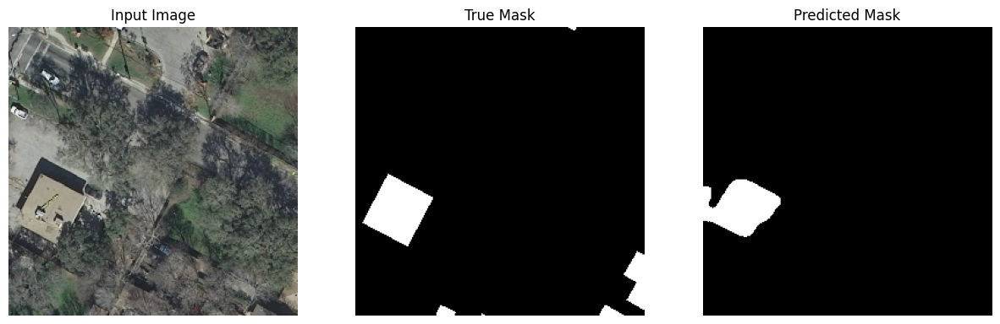

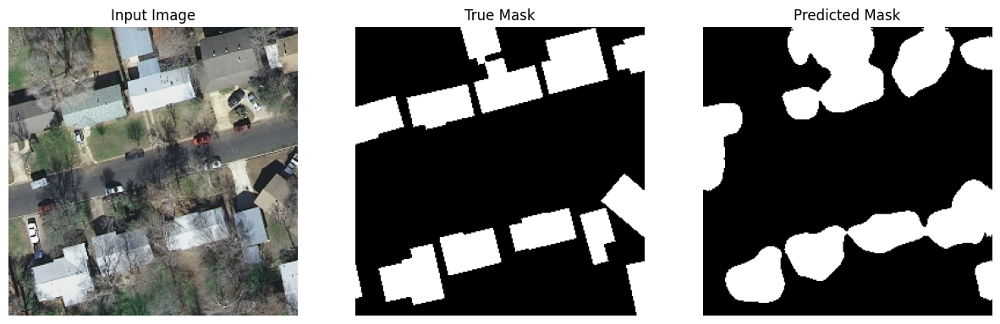

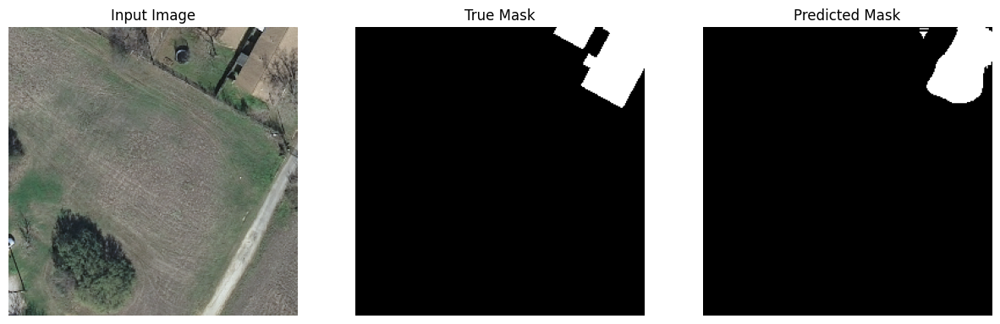

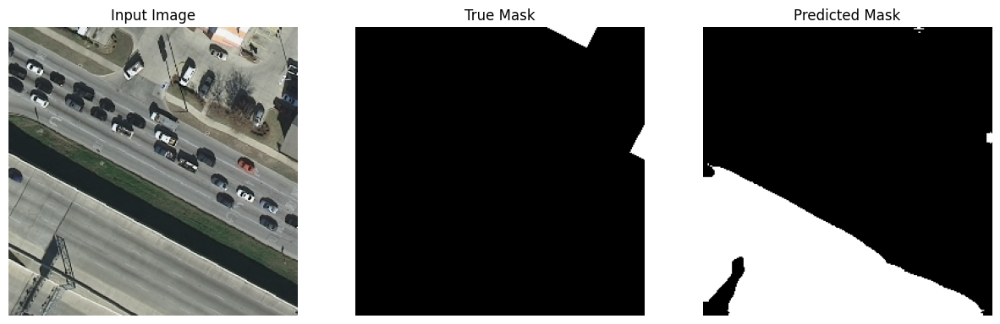

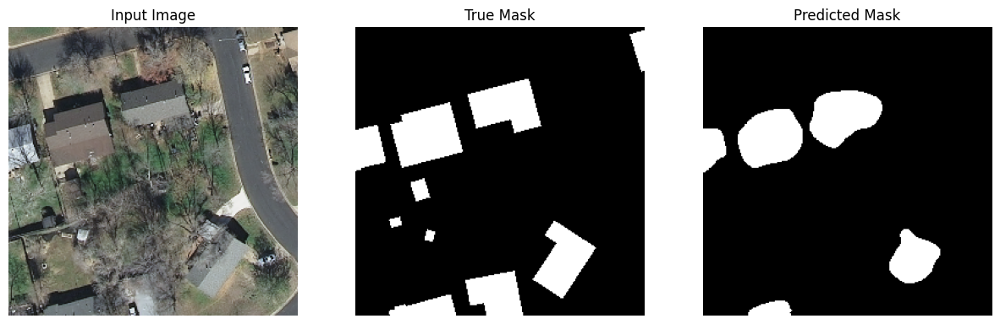

In [22]:
# Predict masked image
pred(unet_model, test_dataset, batch_size, 0.5, 1)

# Check the unmasked image
#for img, mask in test_dataset.take(1):
#        img_pred = unet_model_2.predict(img)
#        for i in range(5):
#            display_pred([img[i], mask[i], img_pred[i]])

In [ ]:
# Fine-tuned VGG16 with low learning rate, patience of 20 and 30 epochs
unet_model.trainable = True

unet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),  # Very low learning rate
              loss=combined_loss,
              metrics=metric)

es = tf.keras.callbacks.EarlyStopping(patience=5,restore_best_weights=True, monitor='val_accuracy')

# lr = tf.keras.callbacks.LearningRateScheduler(lr_sched) # using the lr_reducer defined above

checkpoint_filepath =os.path.join(os.getcwd(),"checkpoints/model_unet")
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

EPOCHS = 30
STEPS_PER_EPOCH = train_length // batch_size

history=unet_model.fit(train_dataset,
                         epochs=EPOCHS,
                         steps_per_epoch=STEPS_PER_EPOCH,
                         validation_data=valid_dataset,
                         callbacks=[model_checkpoint_callback, es, lr_reducer],
                         verbose=1)

Epoch 1/30
1734/1734 [==============================] - ETA: 0s - loss: 1.2840 - accuracy: 0.8392 - binary_io_u_6: 0.4966

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1476s 847ms/step - loss: 1.2840 - accuracy: 0.8392 - binary_io_u_6: 0.4966 - val_loss: 1.1030 - val_accuracy: 0.8329 - val_binary_io_u_6: 0.5159 - lr: 0.0010
Epoch 2/30
1734/1734 [==============================] - 1443s 832ms/step - loss: 1.6290 - accuracy: 0.8221 - binary_io_u_6: 0.5100 - val_loss: 1.0869 - val_accuracy: 0.8210 - val_binary_io_u_6: 0.5256 - lr: 0.0010
Epoch 3/30
1734/1734 [==============================] - 1438s 829ms/step - loss: 1.0748 - accuracy: 0.8219 - binary_io_u_6: 0.5296 - val_loss: 1.0402 - val_accuracy: 0.8311 - val_binary_io_u_6: 0.5405 - lr: 0.0010
Epoch 4/30
1734/1734 [==============================] - ETA: 0s - loss: 1.0259 - accuracy: 0.8285 - binary_io_u_6: 0.5474

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1444s 833ms/step - loss: 1.0259 - accuracy: 0.8285 - binary_io_u_6: 0.5474 - val_loss: 1.0121 - val_accuracy: 0.8332 - val_binary_io_u_6: 0.5510 - lr: 0.0010
Epoch 5/30
1734/1734 [==============================] - ETA: 0s - loss: 1.0005 - accuracy: 0.8340 - binary_io_u_6: 0.5571

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1447s 834ms/step - loss: 1.0005 - accuracy: 0.8340 - binary_io_u_6: 0.5571 - val_loss: 0.9894 - val_accuracy: 0.8386 - val_binary_io_u_6: 0.5594 - lr: 0.0010
Epoch 6/30
1734/1734 [==============================] - ETA: 0s - loss: 0.9796 - accuracy: 0.8381 - binary_io_u_6: 0.5652

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1447s 834ms/step - loss: 0.9796 - accuracy: 0.8381 - binary_io_u_6: 0.5652 - val_loss: 0.9691 - val_accuracy: 0.8430 - val_binary_io_u_6: 0.5681 - lr: 0.0010
Epoch 7/30
1734/1734 [==============================] - ETA: 0s - loss: 0.9596 - accuracy: 0.8418 - binary_io_u_6: 0.5732

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1448s 835ms/step - loss: 0.9596 - accuracy: 0.8418 - binary_io_u_6: 0.5732 - val_loss: 0.9425 - val_accuracy: 0.8480 - val_binary_io_u_6: 0.5794 - lr: 0.0010
Epoch 8/30
1734/1734 [==============================] - ETA: 0s - loss: 0.9400 - accuracy: 0.8457 - binary_io_u_6: 0.5811

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1448s 835ms/step - loss: 0.9400 - accuracy: 0.8457 - binary_io_u_6: 0.5811 - val_loss: 0.9289 - val_accuracy: 0.8531 - val_binary_io_u_6: 0.5840 - lr: 0.0010
Epoch 9/30
1734/1734 [==============================] - ETA: 0s - loss: 0.9200 - accuracy: 0.8495 - binary_io_u_6: 0.5890

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1449s 836ms/step - loss: 0.9200 - accuracy: 0.8495 - binary_io_u_6: 0.5890 - val_loss: 0.9115 - val_accuracy: 0.8569 - val_binary_io_u_6: 0.5923 - lr: 0.0010
Epoch 10/30
1734/1734 [==============================] - 1444s 832ms/step - loss: 0.9004 - accuracy: 0.8534 - binary_io_u_6: 0.5970 - val_loss: 0.8950 - val_accuracy: 0.8460 - val_binary_io_u_6: 0.6010 - lr: 0.0010
Epoch 11/30
1734/1734 [==============================] - 1444s 833ms/step - loss: 0.8675 - accuracy: 0.8604 - binary_io_u_6: 0.6106 - val_loss: 0.8579 - val_accuracy: 0.8558 - val_binary_io_u_6: 0.6159 - lr: 0.0010
Epoch 12/30
1734/1734 [==============================] - 1444s 833ms/step - loss: 0.8529 - accuracy: 0.8633 - binary_io_u_6: 0.6163 - val_loss: 0.8458 - val_accuracy: 0.8564 - val_binary_io_u_6: 0.6208 - lr: 0.0010
Epoch 13/30
1734/1734 [==============================] - ETA: 0s - loss: 0.8395 - accuracy: 0.8660 - binary_io_u_6: 0.6218

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1449s 836ms/step - loss: 0.8395 - accuracy: 0.8660 - binary_io_u_6: 0.6218 - val_loss: 0.8200 - val_accuracy: 0.8641 - val_binary_io_u_6: 0.6304 - lr: 0.0010
Epoch 14/30
1734/1734 [==============================] - 1444s 833ms/step - loss: 0.8242 - accuracy: 0.8689 - binary_io_u_6: 0.6276 - val_loss: 0.8281 - val_accuracy: 0.8597 - val_binary_io_u_6: 0.6280 - lr: 0.0010
Epoch 15/30
1734/1734 [==============================] - ETA: 0s - loss: 0.8157 - accuracy: 0.8706 - binary_io_u_6: 0.6312

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1451s 837ms/step - loss: 0.8157 - accuracy: 0.8706 - binary_io_u_6: 0.6312 - val_loss: 0.7991 - val_accuracy: 0.8686 - val_binary_io_u_6: 0.6382 - lr: 0.0010
Epoch 16/30
1734/1734 [==============================] - ETA: 0s - loss: 0.8096 - accuracy: 0.8718 - binary_io_u_6: 0.6336

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1450s 836ms/step - loss: 0.8096 - accuracy: 0.8718 - binary_io_u_6: 0.6336 - val_loss: 0.7861 - val_accuracy: 0.8732 - val_binary_io_u_6: 0.6430 - lr: 0.0010
Epoch 17/30
1734/1734 [==============================] - ETA: 0s - loss: 0.7756 - accuracy: 0.8780 - binary_io_u_6: 0.6471

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1449s 836ms/step - loss: 0.7756 - accuracy: 0.8780 - binary_io_u_6: 0.6471 - val_loss: 0.7603 - val_accuracy: 0.8796 - val_binary_io_u_6: 0.6534 - lr: 0.0010
Epoch 21/30
1734/1734 [==============================] - 1445s 833ms/step - loss: 0.7696 - accuracy: 0.8791 - binary_io_u_6: 0.6494 - val_loss: 0.7523 - val_accuracy: 0.8789 - val_binary_io_u_6: 0.6570 - lr: 0.0010
Epoch 22/30
1734/1734 [==============================] - ETA: 0s - loss: 0.7634 - accuracy: 0.8802 - binary_io_u_6: 0.6519

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1451s 837ms/step - loss: 0.7634 - accuracy: 0.8802 - binary_io_u_6: 0.6519 - val_loss: 0.7443 - val_accuracy: 0.8812 - val_binary_io_u_6: 0.6601 - lr: 0.0010
Epoch 23/30
1734/1734 [==============================] - ETA: 0s - loss: 0.7572 - accuracy: 0.8813 - binary_io_u_6: 0.6544

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1453s 838ms/step - loss: 0.7572 - accuracy: 0.8813 - binary_io_u_6: 0.6544 - val_loss: 0.7410 - val_accuracy: 0.8825 - val_binary_io_u_6: 0.6615 - lr: 0.0010
Epoch 24/30
1734/1734 [==============================] - ETA: 0s - loss: 0.7511 - accuracy: 0.8824 - binary_io_u_6: 0.6568

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1448s 835ms/step - loss: 0.7511 - accuracy: 0.8824 - binary_io_u_6: 0.6568 - val_loss: 0.7342 - val_accuracy: 0.8833 - val_binary_io_u_6: 0.6645 - lr: 0.0010
Epoch 25/30
1734/1734 [==============================] - 1443s 832ms/step - loss: 0.7476 - accuracy: 0.8830 - binary_io_u_6: 0.6584 - val_loss: 0.7332 - val_accuracy: 0.8827 - val_binary_io_u_6: 0.6648 - lr: 0.0010
Epoch 26/30
1734/1734 [==============================] - ETA: 0s - loss: 0.7432 - accuracy: 0.8837 - binary_io_u_6: 0.6600

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1451s 837ms/step - loss: 0.7432 - accuracy: 0.8837 - binary_io_u_6: 0.6600 - val_loss: 0.7295 - val_accuracy: 0.8836 - val_binary_io_u_6: 0.6664 - lr: 0.0010
Epoch 27/30
1734/1734 [==============================] - 1447s 834ms/step - loss: 0.7379 - accuracy: 0.8847 - binary_io_u_6: 0.6622 - val_loss: 0.7287 - val_accuracy: 0.8832 - val_binary_io_u_6: 0.6669 - lr: 0.0010
Epoch 28/30
1734/1734 [==============================] - ETA: 0s - loss: 0.7331 - accuracy: 0.8855 - binary_io_u_6: 0.6641

INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


INFO:tensorflow:Assets written to: /home/jupyter/checkpoints/model_unet/assets


1734/1734 [==============================] - 1452s 837ms/step - loss: 0.7331 - accuracy: 0.8855 - binary_io_u_6: 0.6641 - val_loss: 0.7243 - val_accuracy: 0.8844 - val_binary_io_u_6: 0.6685 - lr: 0.0010
Epoch 29/30
1734/1734 [==============================] - 1446s 834ms/step - loss: 0.7301 - accuracy: 0.8859 - binary_io_u_6: 0.6653 - val_loss: 0.7229 - val_accuracy: 0.8835 - val_binary_io_u_6: 0.6692 - lr: 0.0010
Epoch 30/30
1734/1734 [==============================] - 1446s 834ms/step - loss: 0.7262 - accuracy: 0.8866 - binary_io_u_6: 0.6669 - val_loss: 0.7237 - val_accuracy: 0.8827 - val_binary_io_u_6: 0.6688 - lr: 0.0010


In [215]:
unet_model.evaluate(test_dataset)

360/360 [==============================] - 94s 261ms/step - loss: 0.7924 - accuracy: 0.8839 - binary_io_u_6: 0.6704


[0.7923683524131775, 0.883903443813324, 0.6704273819923401]

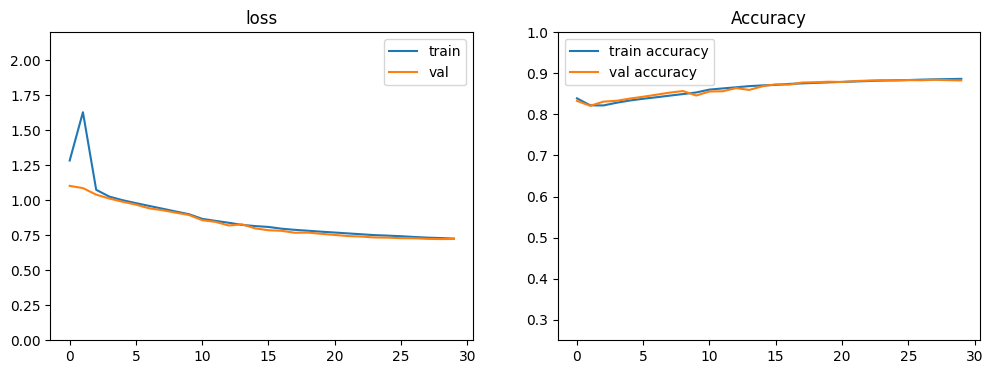

In [216]:
plot_history(history);

In [217]:
# Save the history to a file
with open('trainHistoryDict/history_unet2_rerun', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

In [218]:
unet_model.save('models/Model_30epochs_unet_2_rerun.h5')

1/1 [==============================] - 0s 47ms/step


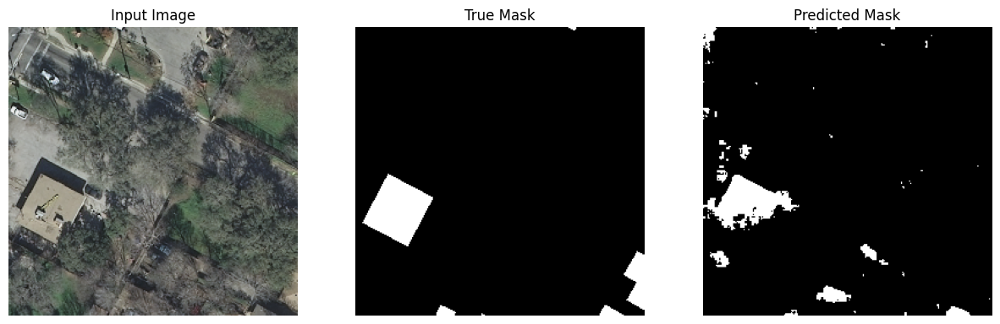

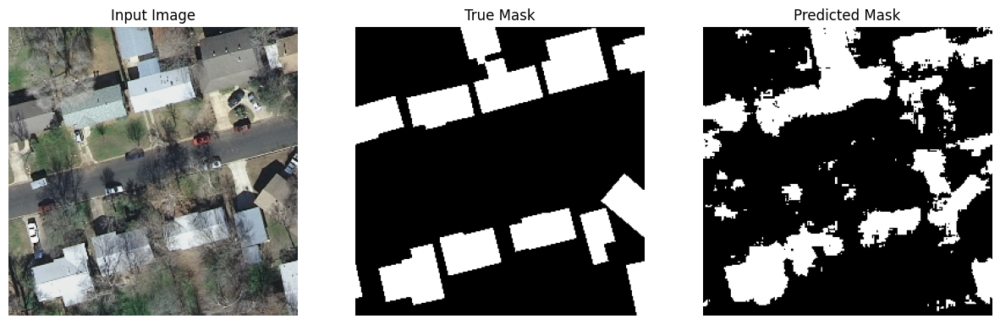

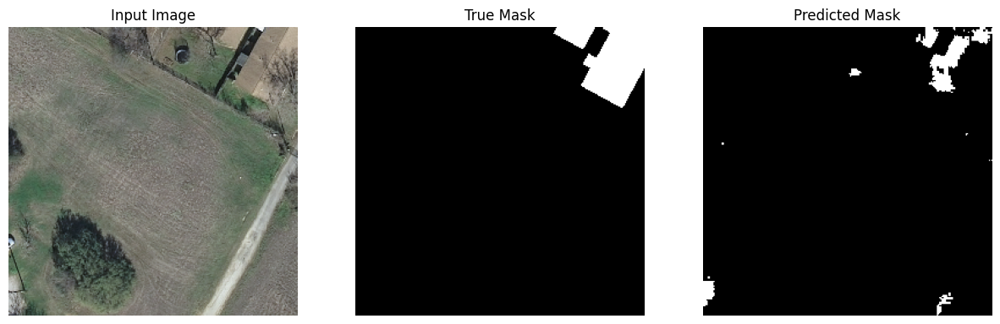

In [221]:
pred(unet_model, test_dataset, batch_size, 0.5, 1)

# Check the unmasked image
#for img, mask in test_dataset.take(1):
#        img_pred = unet_model_2.predict(img)
#        for i in range(5):
#            display_pred([img[i], mask[i], img_pred[i]])

#### VGG16 Model with shape = (224,224,3) and Preprocess_Input Test

In [166]:
# Create new datasets for the resized shape
train_vg = create_dataset(train_df, vgg16 = True)
valid_vg = create_dataset(valid_df, vgg16 = True) 
test_vg = create_dataset(X_test, vgg16 = True)

train_vg_dataset = train_vg.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
valid_vg_dataset = valid_vg.batch(batch_size)
test_vg_dataset = test_vg.batch(batch_size)

In [63]:
# Using Kaggle definition for U-Net model vgg16 with BatchNormalization

# Imports
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input, ZeroPadding2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16

# Convolution block definition for 2 Conv2d, a batch normalization layer, and an activation layer
def conv_block(inputs,filterCount):
    x = Conv2D(filterCount,3,padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = Conv2D(filterCount,3,padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    return x

# Decoder definition (encoder will be used from the vgg16 model defined below)
def decoder_block(inputs,skip_features,filter_count):
    x = Conv2DTranspose(filter_count, (2, 2), strides=2, padding="same")(inputs)
    if skip_features.shape[1] != x.shape[1]:
        x = ZeroPadding2D(padding=((0, 1), (0, 1)))(x)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, filter_count)
    return x

# The U-Net model with transfer learning
def unet_vgg16_k(input_shape):
    inputs = Input(input_shape)
    vgg16 = VGG16(include_top=False,weights='imagenet',input_tensor = inputs)
    vgg16.trainable = False
    
    # the encoder 
    skip1 = vgg16.get_layer("block1_conv2").output
    skip2 = vgg16.get_layer("block2_conv2").output
    skip3 = vgg16.get_layer("block3_conv3").output
    skip4 = vgg16.get_layer("block4_conv3").output
    
    # the center
    center = vgg16.get_layer("block5_conv3").output
    
    # the decoder 
    d1 = decoder_block(center,skip4,512)
    d2 = decoder_block(d1,skip3,256)
    d3 = decoder_block(d2,skip2,128)
    d4 = decoder_block(d3,skip1,64)
    
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs, name="VGG16_U-Net")
    return model

In [81]:
input_shape = (224,224,3)
model_k = unet_vgg16_k(input_shape)
model_k.summary()  

Model: "VGG16_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 64  36928       ['block1_conv1[0][0]']           
                                )                                                       

In [103]:
# Fine-tune and run the model after initial test
model_k.trainable = True

# Compile the model
model_k.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # Very low learning rate
              loss="binary_crossentropy",
              metrics=metric)

#model_k.compile(optimizer="adam",
#              loss="binary_crossentropy",
#              metrics=metric)

In [ ]:
# Define model checkpoints
checkpoint_filepath = os.path.join(os.getcwd(),'checkpoints/model_k')

if not os.path.exists(checkpoint_filepath):
    os.mkdir(checkpoint_filepath)

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

EPOCHS = 30
STEPS_PER_EPOCH = train_length // batch_size

history=model_k.fit(train_vg_dataset,
                    epochs=EPOCHS,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_vg_dataset,
                    callbacks=[model_checkpoint_callback],
                    verbose=1)

In [105]:
# Save the history to a file
with open('trainHistoryDict/history_2', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

In [ ]:
# Retrieve the loaded history
#with open('trainHistoryDict/history_2', "rb") as file_pi:
#    history = pickle.load(file_pi)

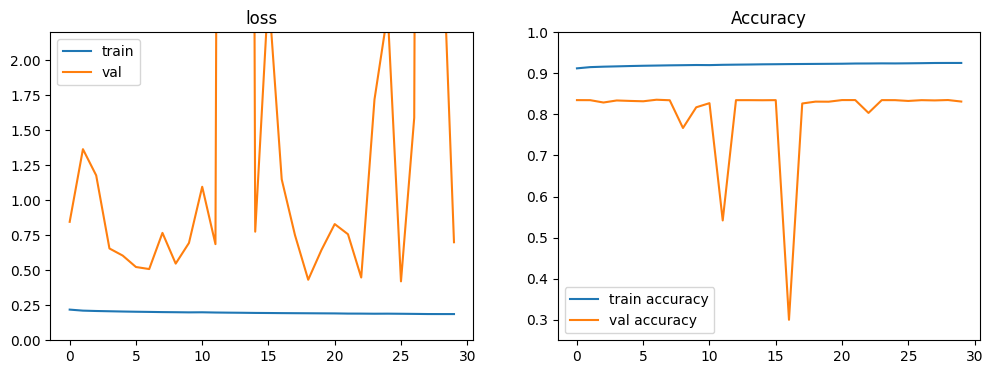

In [106]:
plot_history(history);

In [107]:
model_k.save('models/model_30_vgg16.h5')

In [108]:
# Evaluate the model
model_k.evaluate(test_vg_dataset)

360/360 [==============================] - 75s 208ms/step - loss: 0.6939 - accuracy: 0.8325 - binary_io_u_1: 0.4407


[0.6938909292221069, 0.8324994444847107, 0.4407194256782532]

In [ ]:
# Predict masked image
#pred(model_k, test_vg_dataset, batch_size, 0.5, 1)

# Check the unmasked image
for img, mask in test_vg_dataset.take(1):
        img_pred = model_k.predict(img)
        for i in range(5):
            display_pred([img[i], mask[i], img_pred[i]])

(<Axes: title={'center': 'loss'}>, <Axes: title={'center': 'Accuracy'}>)

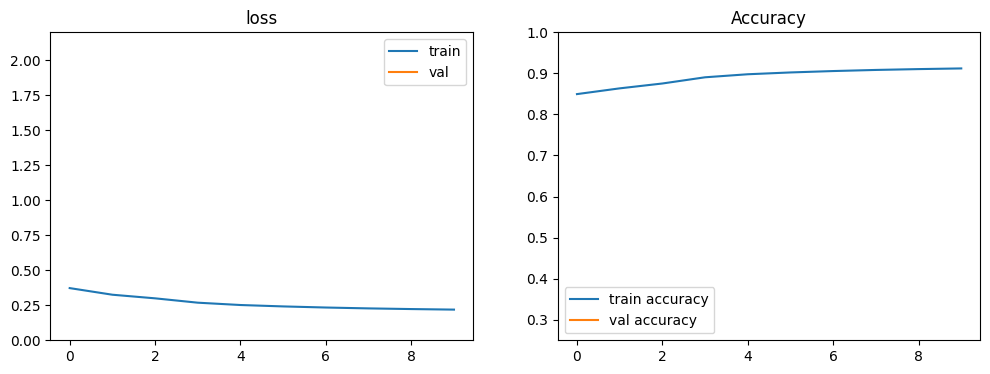

In [102]:
plot_history(history)

# Check the unmasked image
#for img, mask in test_vg_dataset.take(1):
#        img_pred = model_k.predict(img)
#        for i in range(5):
#            display_pred([img[i], mask[i], img_pred[i]])